In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

In [2]:
os.getcwd()

'/Users/regan/Documents/Springboard/Capstone2.0/Final_Versions'

In [3]:
#show all columns
from IPython.display import display

pd.set_option('display.max_columns', None)

In [9]:
#load cleaned dataset 
pbp = pd.read_csv('Data/pbp_cleaned.csv')
pbp=pbp.rename(columns={'activeteam':'offense','active_conf':'off_conf'})
pbp.head()

,gameid,hometeam,awayteam,playid,offense,nonactive team,drive #,quarter,sec,homescore,awayscore,down,distance,yardstoendzone,zone,qb,pass yds,receiver,recyds,runner,runyds,kicker,kickyds,kickreturner,kickretyds,placekicker,pkyds,pkresult,penalty,int,fumble,td,xp result,two pt result,week,home_conf,away_conf,off_conf,home_rank,away_rank,gain_loss,yards,scored,is_home,off_team_score,def_team_score,off_team_rank,def_team_rank,run_pass,rank_group,rank_group_def
0,401110730,tennessee volunteers,georgia state panthers,104857801,tennessee volunteers,georgia state panthers,8,4,861,20,21,1,10,76,GREEN,Jarrett Guarantano,54.0,Dominick Wood-Anderson,54.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,NaN,NaN,1,sec,NaN,sec,NaN,NaN,gain,54.0,0.0,1.0,20.0,21.0,NaN,NaN,pass,unranked,unranked
1,401110730,tennessee volunteers,georgia state panthers,104994406,tennessee volunteers,georgia state panthers,12,4,55,23,38,3,4,36,ORANGE,Jarrett Guarantano,18.0,Dominick Wood-Anderson,18.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,NaN,NaN,1,sec,NaN,sec,NaN,NaN,gain,18.0,0.0,1.0,23.0,38.0,NaN,NaN,pass,unranked,unranked
2,401110730,tennessee volunteers,georgia state panthers,101884406,tennessee volunteers,georgia state panthers,2,1,715,0,7,3,4,62,GREEN,Jarrett Guarantano,7.0,Dominick Wood-Anderson,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,NaN,NaN,1,sec,NaN,sec,NaN,NaN,gain,7.0,0.0,1.0,0.0,7.0,NaN,NaN,pass,unranked,unranked
3,401110730,tennessee volunteers,georgia state panthers,101979201,tennessee volunteers,georgia state panthers,3,1,127,7,7,1,10,46,YELLOW,Jarrett Guarantano,0.0,Dominick Wood-Anderson,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,NaN,NaN,1,sec,NaN,sec,NaN,NaN,no yards,0.0,0.0,1.0,7.0,7.0,NaN,NaN,pass,unranked,unranked
4,401110732,vanderbilt commodores,georgia bulldogs,102876901,vanderbilt commodores,georgia bulldogs,2,2,750,0,14,3,31,62,GREEN,Riley Neal,5.0,Justice Shelton-Mosley,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,NaN,NaN,1,sec,sec,sec,NaN,3.0,gain,5.0,0.0,1.0,0.0,14.0,NaN,3.0,pass,unranked,top 5


In [10]:
#keep only relevant columns
pbp = pbp[['offense', 'drive #', 'quarter',
                  'down','distance','yardstoendzone','zone','penalty','int','fumble','week',
                  'off_conf','yards','scored','gain_loss','is_home','def_team_score','off_team_score',
           'run_pass','rank_group','rank_group_def']]

In [11]:
#check for missing values 
pbp.isna().sum()

offense           0
drive #           0
quarter           0
down              0
distance          0
yardstoendzone    0
zone              0
penalty           0
int               0
fumble            0
week              0
off_conf          0
yards             0
scored            0
gain_loss         0
is_home           0
def_team_score    0
off_team_score    0
run_pass          0
rank_group        0
rank_group_def    0
dtype: int64

In [12]:
pbp.dtypes

offense            object
drive #             int64
quarter             int64
down                int64
distance            int64
yardstoendzone      int64
zone               object
penalty             int64
int                 int64
fumble              int64
week                int64
off_conf           object
yards             float64
scored            float64
gain_loss          object
is_home           float64
def_team_score    float64
off_team_score    float64
run_pass           object
rank_group         object
rank_group_def     object
dtype: object

<h2 style="background-color:#FAFAD2;"><center><br>Create dummy variables</center>
</h2>

In [13]:
#create dummy variables
pbp_dum = pd.get_dummies(data=pbp, columns=['offense','zone','off_conf','gain_loss','run_pass','rank_group','rank_group_def'])

pbp_dum.head()

,drive #,quarter,down,distance,yardstoendzone,penalty,int,fumble,week,yards,scored,is_home,def_team_score,off_team_score,offense_alabama crimson tide,offense_arkansas razorbacks,offense_auburn tigers,offense_florida gators,offense_georgia bulldogs,offense_illinois fighting illini,offense_indiana hoosiers,offense_iowa hawkeyes,offense_kentucky wildcats,offense_lsu tigers,offense_maryland terrapins,offense_michigan state spartans,offense_michigan wolverines,offense_minnesota golden gophers,offense_mississippi state bulldogs,offense_missouri tigers,offense_nebraska cornhuskers,offense_northwestern wildcats,offense_ohio state buckeyes,offense_ole miss rebels,offense_penn state nittany lions,offense_purdue boilermakers,offense_rutgers scarlet knights,offense_south carolina gamecocks,offense_tennessee volunteers,offense_texas a&m aggies,offense_vanderbilt commodores,offense_wisconsin badgers,zone_BLUE,zone_DARK-RED,zone_GREEN,zone_ORANGE,zone_ORANGE-RED,zone_RED,zone_YELLOW,off_conf_big ten,off_conf_sec,gain_loss_gain,gain_loss_loss,gain_loss_no yards,run_pass_other,run_pass_pass,run_pass_run,rank_group_11 to 15,rank_group_16 to 20,rank_group_21 to 25,rank_group_6 to 10,rank_group_top 5,rank_group_unranked,rank_group_def_11 to 15,rank_group_def_16 to 20,rank_group_def_21 to 25,rank_group_def_6 to 10,rank_group_def_top 5,rank_group_def_unranked
0,8,4,1,10,76,0,0,0,1,54.0,0.0,1.0,21.0,20.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1
1,12,4,3,4,36,0,0,0,1,18.0,0.0,1.0,38.0,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1
2,2,1,3,4,62,0,0,0,1,7.0,0.0,1.0,7.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1
3,3,1,1,10,46,0,0,0,1,0.0,0.0,1.0,7.0,7.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1
4,2,2,3,31,62,0,0,0,1,5.0,0.0,1.0,14.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0


In [14]:
pbp_dum.shape

(26540, 69)

<h2 style="background-color:#FAFAD2;"><center><br>Standardization</center>
</h2>

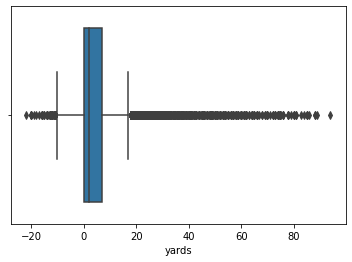

In [15]:
sns.boxplot(x='yards', data=pbp_dum);

In [16]:
#standardize yards

scaler = MinMaxScaler(feature_range=(0,100), copy=True)

pbp_dum['yards_sc'] = scaler.fit_transform(pbp_dum[['yards']].to_numpy())

pbp_dum.head()

,drive #,quarter,down,distance,yardstoendzone,penalty,int,fumble,week,yards,scored,is_home,def_team_score,off_team_score,offense_alabama crimson tide,offense_arkansas razorbacks,offense_auburn tigers,offense_florida gators,offense_georgia bulldogs,offense_illinois fighting illini,offense_indiana hoosiers,offense_iowa hawkeyes,offense_kentucky wildcats,offense_lsu tigers,offense_maryland terrapins,offense_michigan state spartans,offense_michigan wolverines,offense_minnesota golden gophers,offense_mississippi state bulldogs,offense_missouri tigers,offense_nebraska cornhuskers,offense_northwestern wildcats,offense_ohio state buckeyes,offense_ole miss rebels,offense_penn state nittany lions,offense_purdue boilermakers,offense_rutgers scarlet knights,offense_south carolina gamecocks,offense_tennessee volunteers,offense_texas a&m aggies,offense_vanderbilt commodores,offense_wisconsin badgers,zone_BLUE,zone_DARK-RED,zone_GREEN,zone_ORANGE,zone_ORANGE-RED,zone_RED,zone_YELLOW,off_conf_big ten,off_conf_sec,gain_loss_gain,gain_loss_loss,gain_loss_no yards,run_pass_other,run_pass_pass,run_pass_run,rank_group_11 to 15,rank_group_16 to 20,rank_group_21 to 25,rank_group_6 to 10,rank_group_top 5,rank_group_unranked,rank_group_def_11 to 15,rank_group_def_16 to 20,rank_group_def_21 to 25,rank_group_def_6 to 10,rank_group_def_top 5,rank_group_def_unranked,yards_sc
0,8,4,1,10,76,0,0,0,1,54.0,0.0,1.0,21.0,20.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,65.517241
1,12,4,3,4,36,0,0,0,1,18.0,0.0,1.0,38.0,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,34.482759
2,2,1,3,4,62,0,0,0,1,7.0,0.0,1.0,7.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,25.000000
3,3,1,1,10,46,0,0,0,1,0.0,0.0,1.0,7.0,7.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,18.965517
4,2,2,3,31,62,0,0,0,1,5.0,0.0,1.0,14.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,23.275862


In [17]:
#check that scaled values make sense
compare = pbp_dum[['yards','yards_sc']]
compare.head(15)

,yards,yards_sc
0,54.0,65.517241
1,18.0,34.482759
2,7.0,25.000000
3,0.0,18.965517
4,5.0,23.275862
5,23.0,38.793103
6,6.0,24.137931
7,0.0,18.965517
8,0.0,18.965517
9,0.0,18.965517


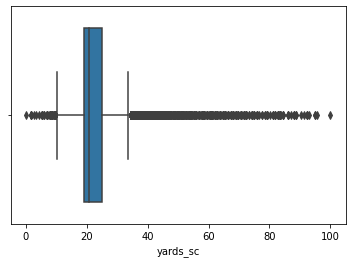

In [18]:
#check boxplot
sns.boxplot(x='yards_sc', data=pbp_dum);

In [19]:
#drop unscaled column
pbp_dum.drop(columns = ['yards'], inplace=True)

<h3> check other variables for need to standardize

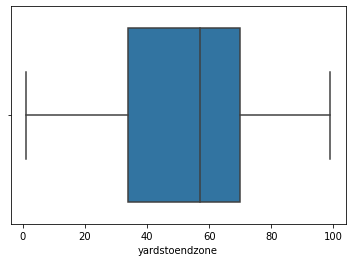

In [20]:
sns.boxplot(x='yardstoendzone', data=pbp_dum);

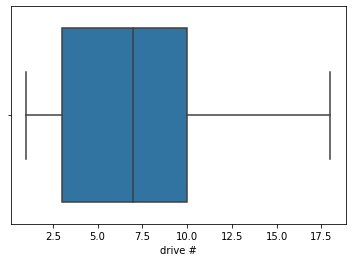

In [21]:
sns.boxplot(x='drive #', data=pbp_dum);

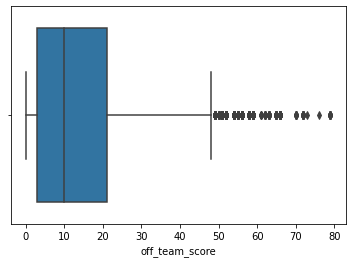

In [22]:
sns.boxplot(x='off_team_score', data=pbp_dum);

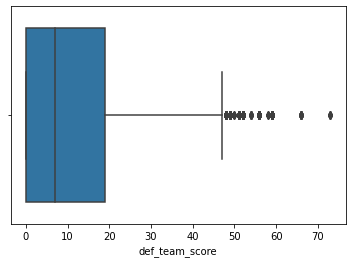

In [23]:
sns.boxplot(x='def_team_score', data=pbp_dum);

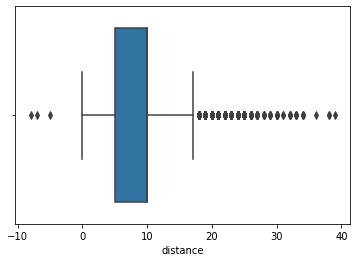

In [24]:
sns.boxplot(x='distance',data=pbp_dum);

<h2 style="background-color:#FAFAD2;"><center><br>Split into train and test sets</center>
</h2>

In [25]:
pbp_dum.head()

,drive #,quarter,down,distance,yardstoendzone,penalty,int,fumble,week,scored,is_home,def_team_score,off_team_score,offense_alabama crimson tide,offense_arkansas razorbacks,offense_auburn tigers,offense_florida gators,offense_georgia bulldogs,offense_illinois fighting illini,offense_indiana hoosiers,offense_iowa hawkeyes,offense_kentucky wildcats,offense_lsu tigers,offense_maryland terrapins,offense_michigan state spartans,offense_michigan wolverines,offense_minnesota golden gophers,offense_mississippi state bulldogs,offense_missouri tigers,offense_nebraska cornhuskers,offense_northwestern wildcats,offense_ohio state buckeyes,offense_ole miss rebels,offense_penn state nittany lions,offense_purdue boilermakers,offense_rutgers scarlet knights,offense_south carolina gamecocks,offense_tennessee volunteers,offense_texas a&m aggies,offense_vanderbilt commodores,offense_wisconsin badgers,zone_BLUE,zone_DARK-RED,zone_GREEN,zone_ORANGE,zone_ORANGE-RED,zone_RED,zone_YELLOW,off_conf_big ten,off_conf_sec,gain_loss_gain,gain_loss_loss,gain_loss_no yards,run_pass_other,run_pass_pass,run_pass_run,rank_group_11 to 15,rank_group_16 to 20,rank_group_21 to 25,rank_group_6 to 10,rank_group_top 5,rank_group_unranked,rank_group_def_11 to 15,rank_group_def_16 to 20,rank_group_def_21 to 25,rank_group_def_6 to 10,rank_group_def_top 5,rank_group_def_unranked,yards_sc
0,8,4,1,10,76,0,0,0,1,0.0,1.0,21.0,20.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,65.517241
1,12,4,3,4,36,0,0,0,1,0.0,1.0,38.0,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,34.482759
2,2,1,3,4,62,0,0,0,1,0.0,1.0,7.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,25.000000
3,3,1,1,10,46,0,0,0,1,0.0,1.0,7.0,7.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,18.965517
4,2,2,3,31,62,0,0,0,1,0.0,1.0,14.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,23.275862


<h3> train test split for score

In [26]:
X_score = pbp_dum.drop(columns=['scored'])
y_score = pbp_dum['scored']

In [27]:
X_score_train, X_score_test, y_score_train, y_score_test = train_test_split(X_score, y_score, 
                                                                            test_size=0.33, random_state=42)

print(X_score_train.shape)
print(X_score_test.shape)
print(y_score_train.shape)
print(y_score_test.shape)

(17781, 68)
(8759, 68)
(17781,)
(8759,)


<h3> train test split for gain_loss

<p style= "font-family: Times ; font-size: 18px">
Not using yards to predict gain_loss (variable: yards_sc), as yards are either positive, negative, or 0 and would result in perfect prediction. 

In [28]:
from sklearn import preprocessing

X_gl = pbp_dum.drop(columns=['gain_loss_gain','gain_loss_loss','gain_loss_no yards','yards_sc'])
# Create a label (category) encoder object
le = preprocessing.LabelEncoder()
# Fit the encoder to the pandas column
le.fit(pbp['gain_loss'])
list(le.classes_)
y_gl = le.transform(pbp['gain_loss']) 

X_gl_train, X_gl_test, y_gl_train, y_gl_test = train_test_split(X_gl, y_gl, test_size=0.33, random_state=42)

print(X_gl_train.shape)
print(X_gl_test.shape)
print(y_gl_train.shape)
print(y_gl_test.shape)

(17781, 65)
(8759, 65)
(17781,)
(8759,)


<h3> train test split for yards

<p style= "font-family: Times ; font-size: 18px">
    Not using gain_loss to predict yards

In [29]:
X_yards = pbp_dum.drop(columns = ['gain_loss_gain','gain_loss_loss','gain_loss_no yards','yards_sc'])
y_yards = pbp_dum['yards_sc']

X_yards_train, X_yards_test, y_yards_train, y_yards_test = train_test_split(X_yards, y_yards, 
                                                                            test_size=0.33, random_state=42)

print(X_yards_train.shape)
print(X_yards_test.shape)
print(y_yards_train.shape)
print(y_yards_test.shape)


(17781, 65)
(8759, 65)
(17781,)
(8759,)


<h1 style="background-color:#FAF0E6;"><center><br>Modeling</center>
</h1>

<h2 style="background-color:#FAFAD2;"><center><br>Modeling scored</center>
</h2>

<h2> Decision tree

In [30]:
from sklearn.tree import DecisionTreeClassifier

In [31]:
clf = DecisionTreeClassifier()

clf.fit(X_score_train, y_score_train)

y_score_pred = clf.predict(X_score_test)

In [32]:
from sklearn import metrics
print("Model - no max depth")
print("Accuracy:", metrics.accuracy_score(y_score_test, y_score_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_score_test, y_score_pred))
print('Precision score' , metrics.precision_score(y_score_test, y_score_pred))
print('Recall score' , metrics.recall_score(y_score_test, y_score_pred))


Model - no max depth
Accuracy: 0.9858431327777144
Balanced accuracy: 0.9404945173661752
Precision score 0.8789571694599627
Recall score 0.8888888888888888


In [33]:
print(clf.tree_.max_depth)

17


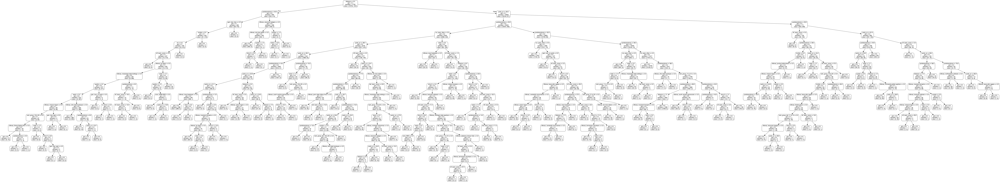

In [34]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
from IPython.display import Image  


# Pull out one tree from the forest
tree = clf
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
# Pull out one tree from the forest
tree =clf
# Export the image to a dot file
export_graphviz(tree, out_file = 'tree.dot', feature_names = X_score_train.columns, rounded = True, precision = 1)
# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('tree.dot')
# Write graph to a png file
graph.write_png('tree.png')
#show image
Image(graph.create_png())

In [35]:
# tuning tree depth

accuracy = {}
precision = []
recall = []
labels = []

for i in range(3,18):
    clf = DecisionTreeClassifier(max_depth=i, random_state=42)
    clf.fit(X_score_train, y_score_train)
    y_pred = clf.predict(X_score_test)
    accuracy[i] = metrics.accuracy_score(y_score_test, y_pred)
    precision.append(metrics.precision_score(y_score_test, y_pred))
    recall.append(metrics.recall_score(y_score_test, y_pred))
    labels.append(i)

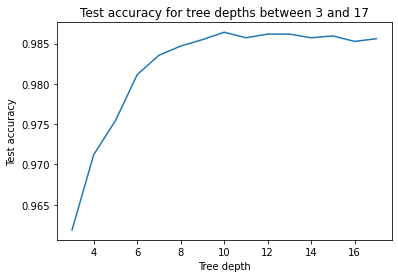

In [38]:
lists = accuracy.items() 

x, y = zip(*lists) 

plt.plot(x, y)
plt.xlabel('Tree depth')
plt.ylabel('Test accuracy')
plt.title('Test accuracy for tree depths between 3 and 17')
plt.show();

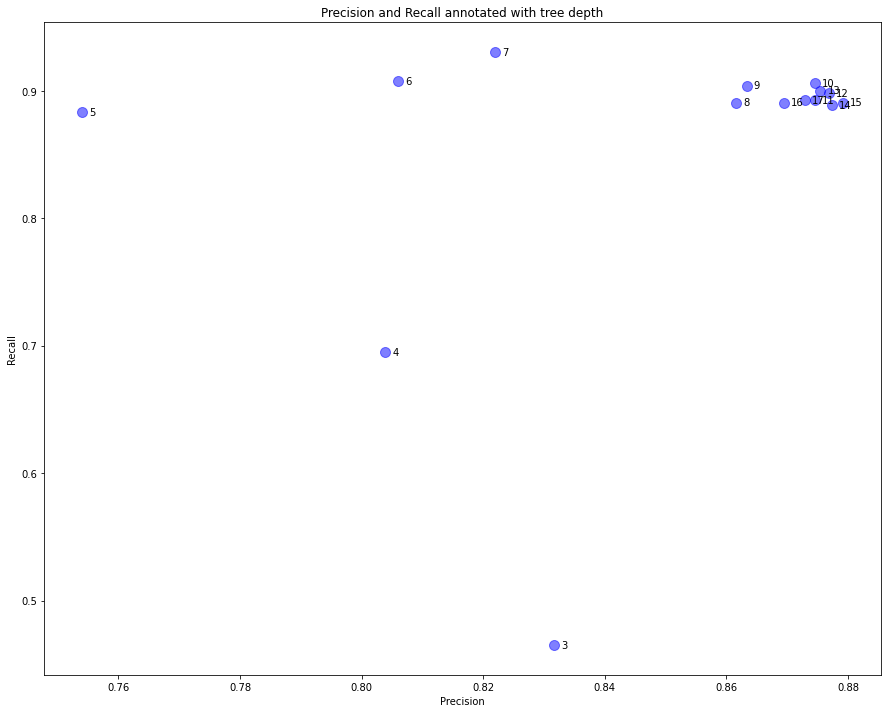

In [40]:
fig, ax = plt.subplots(1, figsize=(15, 12))

x = precision
y = recall


# Plot the scatter points
ax.scatter(x, y,
           color="blue",  # Color of the dots
           s=100,         # Size of the dots
           alpha=0.5,     # Alpha of the dots
           linewidths=1)  # Size of edge around the dots

# Add the participant names as text labels for each point
for x_pos, y_pos, label in zip(x, y, labels):
    ax.annotate(label,             # The label for this point
                xy=(x_pos, y_pos), # Position of the corresponding point
                xytext=(7, 0),     # Offset text by 7 points to the right
                textcoords='offset points', # tell it to use offset points
                ha='left',         # Horizontally aligned to the left
                va='center')       # Vertical alignment is centered

# Show the plot
plt.xlabel('Precision')
plt.ylabel('Recall')
plt.title('Precision and Recall annotated with tree depth')
plt.show();

In [41]:
clf = DecisionTreeClassifier(max_depth=10, random_state=42)
clf.fit(X_score_train, y_score_train)
y_pred_clf  = clf.predict(X_score_test)
print(metrics.accuracy_score(y_score_test, y_pred_clf))

0.9864139741979678


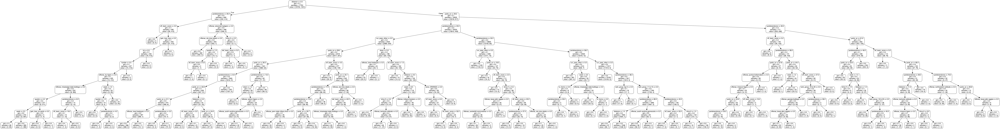

In [42]:
tree = clf
# Export the image to a dot file
export_graphviz(tree, out_file = 'tree.dot', feature_names = X_score_train.columns, rounded = True, precision = 1)
# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('tree.dot')
# Write graph to a png file
graph.write_png('tree.png')
#show image
Image(graph.create_png())

In [128]:
print("Model - Max depth 10")
print("Accuracy:", metrics.accuracy_score(y_score_test, y_pred_clf))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_score_test, y_pred_clf))
print('Precision score' , metrics.precision_score(y_score_test, y_pred_clf))
print('Recall score' , metrics.recall_score(y_score_test, y_pred_clf))

Model - Max depth 10
Accuracy: 0.9864139741979678
Balanced accuracy: 0.9487260212017757
Precision score 0.8745454545454545
Recall score 0.9058380414312618


<p style= "font-family: Times ; font-size: 18px"> Some of the leaves still have very small sample sizes. Could also consider a depth of 4 or 6, as these are points at which the accuracy increases at a lower rate

Confusion matrix, without normalization
[[8159   69]
 [  50  481]]
Normalized confusion matrix
[[0.991614   0.008386  ]
 [0.09416196 0.90583804]]


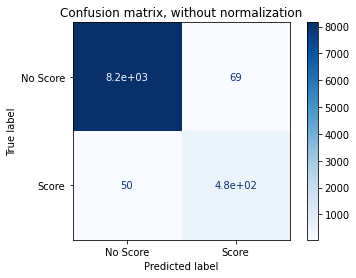

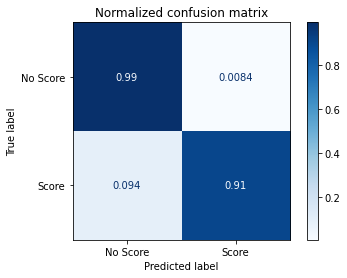

In [129]:
#confusion matrix

from sklearn.metrics import plot_confusion_matrix

# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(clf, X_score_test, y_score_test,
                                 cmap=plt.cm.Blues,
                                 display_labels=['No Score', 'Score'],
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show();

30


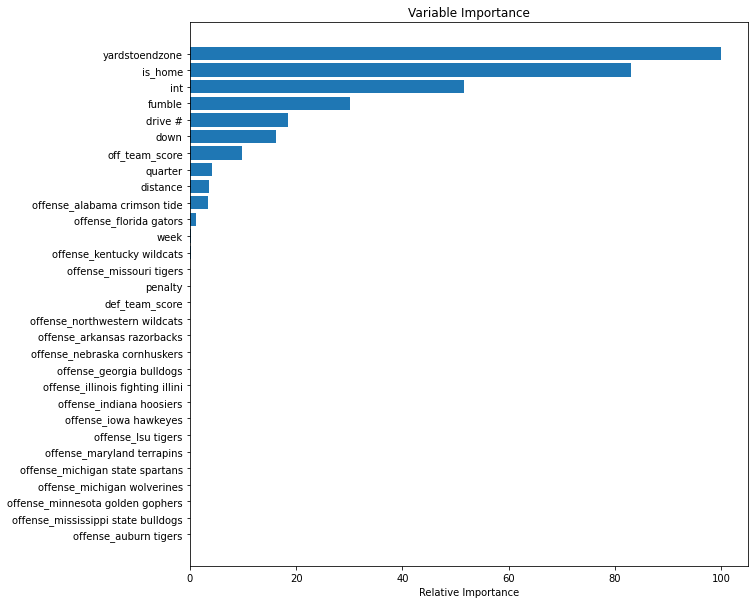

In [130]:
feature_importance_ = clf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())[:30]
sorted_idx = np.argsort(feature_importance)[:30]

pos = np.arange(sorted_idx.shape[0]) + .5
print(pos.size)
sorted_idx.size
plt.figure(figsize=(10,10))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_score_train.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

0.9811622331316361


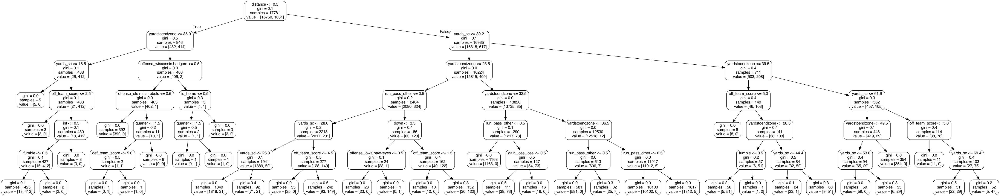

In [44]:
clf = DecisionTreeClassifier(max_depth=6)
clf.fit(X_score_train, y_score_train)
y_pred_clf = clf.predict(X_score_test)
print(metrics.accuracy_score(y_score_test, y_pred_clf))

tree = clf
# Export the image to a dot file
export_graphviz(tree, out_file = 'tree.dot', feature_names = X_score_train.columns, rounded = True, precision = 1)
# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('tree.dot')
# Write graph to a png file
graph.write_png('tree.png')
#show image
Image(graph.create_png())

In [45]:
print("Model - Max depth 6")
print("Accuracy:", metrics.accuracy_score(y_score_test, y_pred_clf))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_score_test, y_pred_clf))
print('Precision score' , metrics.precision_score(y_score_test, y_pred_clf))
print('Recall score' , metrics.recall_score(y_score_test, y_pred_clf))

Model - Max depth 6
Accuracy: 0.9811622331316361
Balanced accuracy: 0.94681153966933
Precision score 0.8060200668896321
Recall score 0.9077212806026366


Confusion matrix, without normalization
[[8112  116]
 [  49  482]]
Normalized confusion matrix
[[0.9859018  0.0140982 ]
 [0.09227872 0.90772128]]


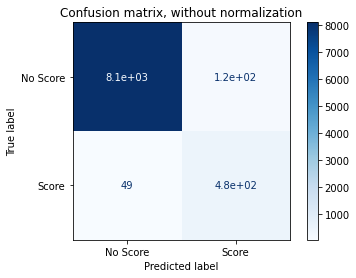

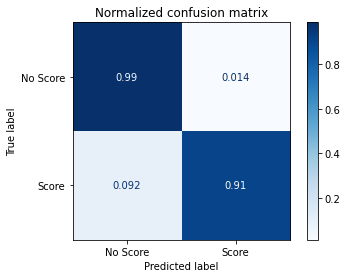

In [46]:
#confusion matrix

from sklearn.metrics import plot_confusion_matrix

# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(clf, X_score_test, y_score_test,
                                 cmap=plt.cm.Blues,
                                 display_labels=['No Score', 'Score'],
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show();

In [47]:
importance = clf.feature_importances_

Feature: 0, Score: 0.00000
Feature: 1, Score: 0.00120
Feature: 2, Score: 0.01392
Feature: 3, Score: 0.21750
Feature: 4, Score: 0.34494
Feature: 5, Score: 0.00000
Feature: 6, Score: 0.00365
Feature: 7, Score: 0.00353
Feature: 8, Score: 0.00000
Feature: 9, Score: 0.00039
Feature: 10, Score: 0.00066
Feature: 11, Score: 0.03924
Feature: 12, Score: 0.00000
Feature: 13, Score: 0.00000
Feature: 14, Score: 0.00000
Feature: 15, Score: 0.00000
Feature: 16, Score: 0.00000
Feature: 17, Score: 0.00000
Feature: 18, Score: 0.00000
Feature: 19, Score: 0.00126
Feature: 20, Score: 0.00000
Feature: 21, Score: 0.00000
Feature: 22, Score: 0.00000
Feature: 23, Score: 0.00000
Feature: 24, Score: 0.00000
Feature: 25, Score: 0.00000
Feature: 26, Score: 0.00000
Feature: 27, Score: 0.00000
Feature: 28, Score: 0.00000
Feature: 29, Score: 0.00000
Feature: 30, Score: 0.00000
Feature: 31, Score: 0.00012
Feature: 32, Score: 0.00000
Feature: 33, Score: 0.00000
Feature: 34, Score: 0.00000
Feature: 35, Score: 0.00000
Fe

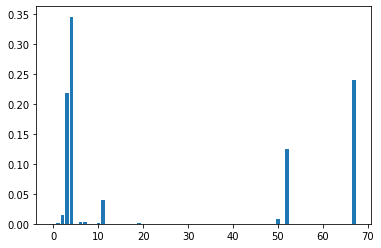

In [48]:
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v));
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

30


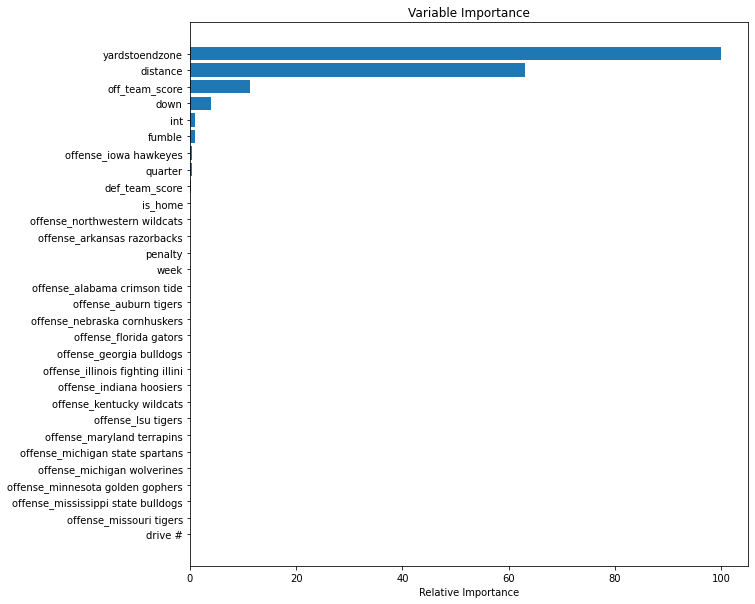

In [49]:
feature_importance = clf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())[:30]
sorted_idx = np.argsort(feature_importance)[:30]

pos = np.arange(sorted_idx.shape[0]) + .5
print(pos.size)
sorted_idx.size
plt.figure(figsize=(10,10))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_score_train.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

<h2> Random Forest

In [118]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score

# Instantiate model with 1000 decision trees
rf = RandomForestClassifier(n_estimators = 1000, random_state = 42)


# Train the model on training data
rf.fit(X_score_train, y_score_train)

y_score_pred_rf = rf.predict(X_score_test)

print(accuracy_score(y_score_test, y_score_pred_rf))
print(f1_score(y_score_test, y_score_pred_rf))
print(metrics.precision_score(y_score_test, y_score_pred_rf))
print(metrics.recall_score(y_score_test, y_score_pred_rf))

0.9827605891083457
0.8476286579212917
0.9130434782608695
0.7909604519774012


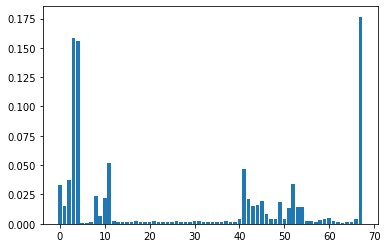

In [51]:
feature_importance = rf.feature_importances_

plt.bar([x for x in range(len(feature_importance))], feature_importance)
plt.show()

30


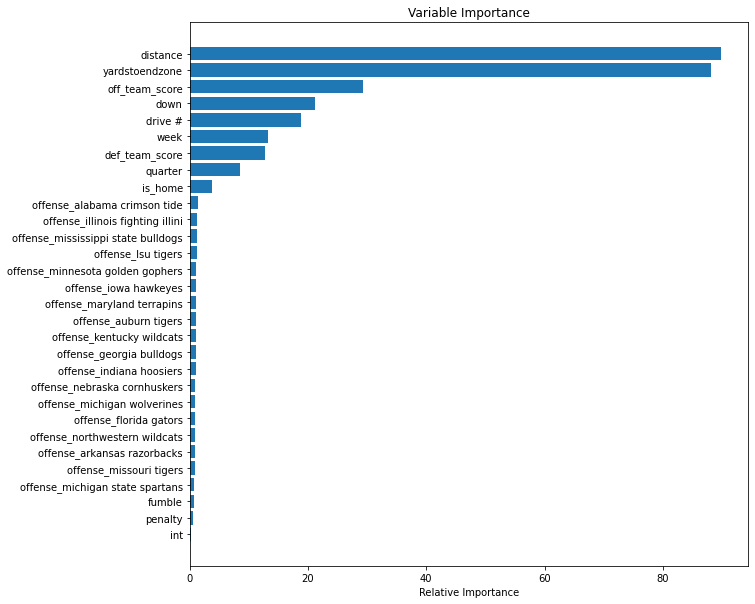

In [52]:
feature_importance = rf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())[:30]
sorted_idx = np.argsort(feature_importance)[:30]

pos = np.arange(sorted_idx.shape[0]) + .5
print(pos.size)
sorted_idx.size
plt.figure(figsize=(10,10))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_score_train.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

In [53]:
# Pull out one tree from the forest
tree = rf.estimators_[5]

# Pull out one tree from the forest
tree = rf.estimators_[5]
# Export the image to a dot file
export_graphviz(tree, out_file = 'tree.dot', feature_names = X_score_train.columns, rounded = True, precision = 1)
# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('tree.dot')
# Write graph to a png file
graph.write_png('tree.png')

In [54]:
Image(graph.create_png())

<h2> logistic regression

In [55]:
from sklearn.linear_model import LogisticRegression

In [56]:
lo_reg = LogisticRegression(random_state=42)

# Fit the model 
lo_reg.fit(X_score_train, y_score_train)

#predict
y_reg_pred = lo_reg.predict(X_score_test)

print(accuracy_score(y_score_test, y_reg_pred))

0.9815047379837881


/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [57]:
# tuning C
Cs = [0.001, 0.1, 1, 10, 25, 50, 75, 100]

scores = {}

for c in Cs:
    reg = LogisticRegression(C=c)
    reg.fit(X_score_train, y_score_train)
    pred = reg.predict(X_score_test)
    scores[c] = np.sqrt(metrics.mean_squared_error(y_score_test, pred))
    

/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear

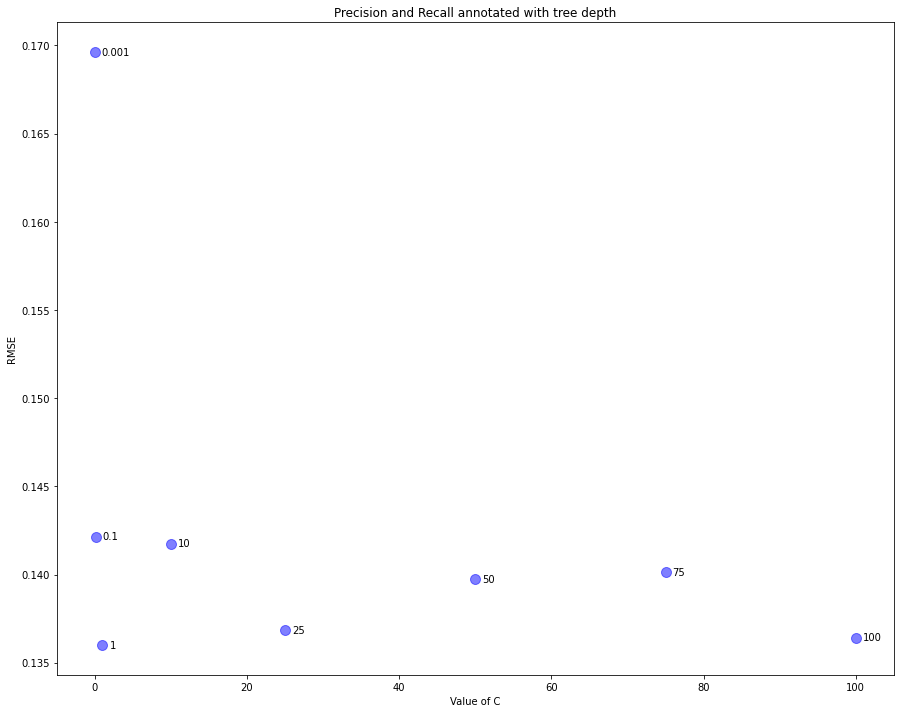

In [58]:
fig, ax = plt.subplots(1, figsize=(15, 12))

lists = scores.items() 

x, y = zip(*lists) 

labels = Cs

# Plot the scatter points
ax.scatter(x, y,
           color="blue",  # Color of the dots
           s=100,         # Size of the dots
           alpha=0.5,     # Alpha of the dots
           linewidths=1)  # Size of edge around the dots

# Add the participant names as text labels for each point
for x_pos, y_pos, label in zip(x, y, labels):
    ax.annotate(label,             # The label for this point
                xy=(x_pos, y_pos), # Position of the corresponding point
                xytext=(7, 0),     # Offset text by 7 points to the right
                textcoords='offset points', # tell it to use offset points
                ha='left',         # Horizontally aligned to the left
                va='center')       # Vertical alignment is centered

# Show the plot
plt.title('Precision and Recall annotated with tree depth')
plt.xlabel('Value of C')
plt.ylabel('RMSE')
plt.show();

In [62]:
#increasing max_iter to converge and implement search for C

from scipy.stats import expon
from sklearn.model_selection import RandomizedSearchCV

params = {'C': expon(scale=100), 'class_weight':['balanced', None], 'penalty':['l1', 'l2', 'elasticnet', 'none']}

lo_reg_CV = LogisticRegression(max_iter=10000)

search_sc = RandomizedSearchCV(lo_reg_CV, params, random_state=1)
search_res_sc = search_sc.fit(X_score_train, y_score_train)
search_res_sc.best_params_

/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.

  FitFailedWarning)

{'C': 54.00910464444293, 'class_weight': None, 'penalty': 'l2'}

In [64]:
lo_reg = LogisticRegression(C=54, max_iter=10000)

# Fit the model 
lo_reg.fit(X_score_train, y_score_train)

#predict
y_reg_pred = lo_reg.predict(X_score_test)

print(accuracy_score(y_score_test, y_reg_pred))
print(np.sqrt(metrics.mean_squared_error(y_score_test, pred)))

0.9809338965635347
0.13641638574695705


In [66]:
# switching solver to 'saga'
params = {'C': expon(scale=100), 'class_weight':['balanced', None], 'penalty':['l1', 'l2', 'elasticnet', 'none']}

lo_reg_CVs = LogisticRegression(solver='saga', max_iter=10000)

search_scs = RandomizedSearchCV(lo_reg_CVs, params, random_state=1)
search_res_scs = search_scs.fit(X_score_train, y_score_train)
search_res_scs.best_params_

/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)


{'C': 20.61146340820805, 'class_weight': None, 'penalty': 'l1'}

In [69]:
lo_reg2 = LogisticRegression(C=20.6, max_iter=10000, solver='saga', penalty='l1')

# Fit the model 
lo_reg2.fit(X_score_train, y_score_train)

#predict
y_reg_pred2 = lo_reg2.predict(X_score_test)

print(accuracy_score(y_score_test, y_reg_pred2))
print(np.sqrt(metrics.mean_squared_error(y_score_test, y_reg_pred2)))

0.9799063820070785
0.1417519593971158


In [70]:
#switching solve to "liblinear"
params = {'C': expon(scale=100), 'class_weight':['balanced', None], 'penalty':['l1', 'l2', 'elasticnet', 'none']}

lo_reg_CVlib = LogisticRegression(solver='liblinear', max_iter=10000)

search_sclib = RandomizedSearchCV(lo_reg_CVlib, params, random_state=1)
search_res_sclib = search_sclib.fit(X_score_train, y_score_train)
search_res_sclib.best_params_

/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  FitFailedWarning)


{'C': 20.61146340820805, 'class_weight': None, 'penalty': 'l1'}

In [71]:
lo_reg3 = LogisticRegression(C=20.6, solver='liblinear', penalty = 'l1')

# Fit the model 
lo_reg3.fit(X_score_train, y_score_train)

#predict
y_reg_pred3 = lo_reg3.predict(X_score_test)

print(accuracy_score(y_score_test, y_reg_pred3))
print(np.sqrt(metrics.mean_squared_error(y_score_test, y_reg_pred3)))

0.9810480648475853
0.1376660275900146


In [121]:
from sklearn.metrics import precision_score, recall_score
print(precision_score(y_score_test, y_reg_pred3))
print(recall_score(y_score_test, y_reg_pred3))

0.8360957642725598
0.8549905838041432


<p style= "font-family: Times ; font-size: 18px">
    The logistic regression with C=20.6 and the liblinear solver and the logistc regression with default parameters and C=54 are the best models. The C-20.6 regression has slightly higher accuracy, while the C=54 regression has slightly lower RMSE. 

<h2 style="background-color:#FAFAD2;"><center><br>Modeling gain_loss</center>
</h2>

# Decision tree

In [72]:
# decision tree

clf_gl = DecisionTreeClassifier()

clf_gl.fit(X_gl_train, y_gl_train)

y_pred_gl = clf_gl.predict(X_gl_test)

print("Accuracy:",metrics.accuracy_score(y_gl_test, y_pred_gl))

Accuracy: 0.6632035620504624


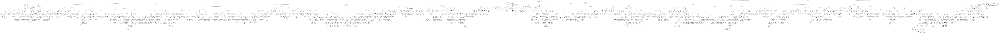

In [73]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
# Pull out one tree from the forest
tree = clf_gl
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
# Pull out one tree from the forest
tree =clf_gl
# Export the image to a dot file
export_graphviz(tree, out_file = 'tree_gl.dot', feature_names = X_gl_train.columns, rounded = True, precision = 1)
# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('tree_gl.dot')
# Write graph to a png file
graph.write_png('tree_gl.png')


Image(graph.create_png())

In [74]:
print(clf_gl.tree_.max_depth)

45


<p style= "font-family: Times ; font-size: 18px">
    I chose to use average='weighted' for the precision and recall scores due to the imbalanced class sizes
    
<p style= "font-family: Times ; font-size: 18px">
Plays where yards are gained are approximately 59% of plays.
Plays where yards are neither gained nor lost are approximately 33% of plays. 
Plays where yards are lost are approximately 8% of plays. 

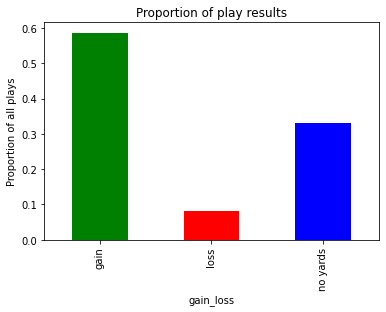

In [78]:
# tuning tree depth

accuracy_gl = {}
precision_gl = []
recall_gl = []
labels_gl = []

for i in range(3,35):
    clf = DecisionTreeClassifier(max_depth=i, random_state=42)
    clf.fit(X_gl_train, y_gl_train)
    y_pred_gl = clf.predict(X_gl_test)
    accuracy_gl[i] = metrics.accuracy_score(y_gl_test, y_pred_gl)
    precision_gl.append(metrics.precision_score(y_gl_test, y_pred_gl, average='weighted'))
    recall_gl.append(metrics.recall_score(y_gl_test, y_pred_gl, average='weighted'))
    labels_gl.append(i)


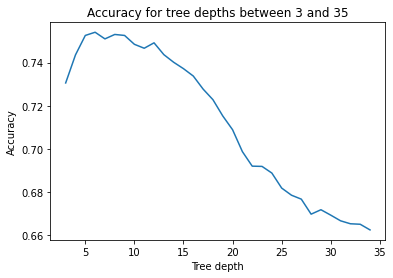

In [79]:
lists_gl = accuracy_gl.items() 

x_gl, y_gl = zip(*lists_gl) 

plt.plot(x_gl, y_gl)
plt.xlabel('Tree depth')
plt.ylabel('Accuracy')
plt.title('Accuracy for tree depths between 3 and 35')
plt.show();

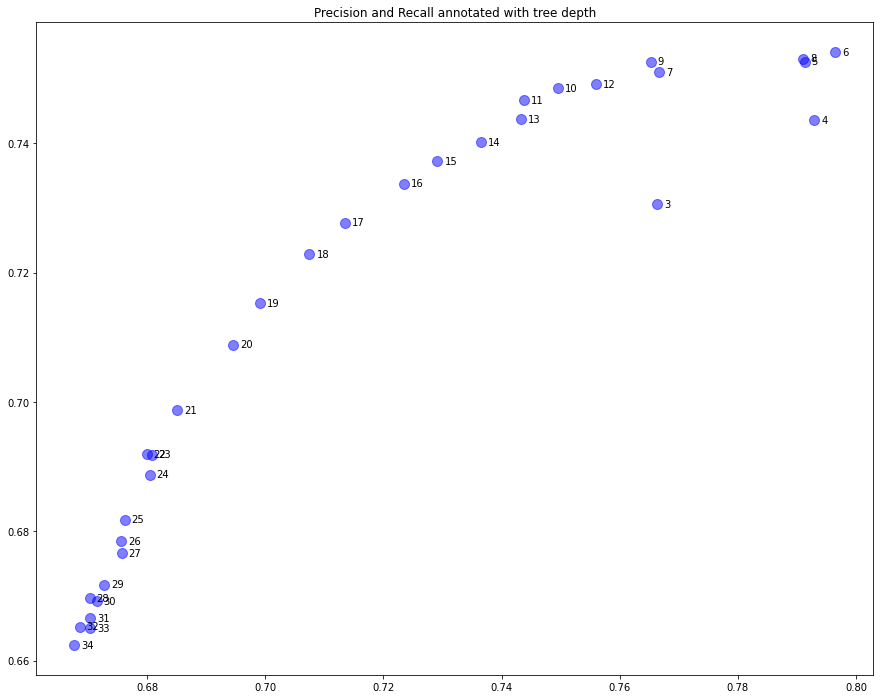

In [80]:
#plotting precision and recall
fig, ax = plt.subplots(1, figsize=(15, 12))

x = precision_gl
y = recall_gl


# Plot the scatter points
ax.scatter(x, y,
           color="blue",  # Color of the dots
           s=100,         # Size of the dots
           alpha=0.5,     # Alpha of the dots
           linewidths=1)  # Size of edge around the dots

# Add the participant names as text labels for each point
for x_pos, y_pos, label in zip(x, y, labels_gl):
    ax.annotate(label,             # The label for this point
                xy=(x_pos, y_pos), # Position of the corresponding point
                xytext=(7, 0),     # Offset text by 7 points to the right
                textcoords='offset points', # tell it to use offset points
                ha='left',         # Horizontally aligned to the left
                va='center')       # Vertical alignment is centered

# Show the plot
plt.title('Precision and Recall annotated with tree depth')
plt.show();

In [81]:
#randomized search

from sklearn.model_selection import RandomizedSearchCV

params_dc = {'max_depth': range(3,35)}


clf_gl = DecisionTreeClassifier()

search = RandomizedSearchCV(clf_gl, params_dc, random_state=1)
search_res = search.fit(X_gl_train, y_gl_train)
search_res.best_params_

{'max_depth': 6}

<p style= "font-family: Times ; font-size: 18px">
The accuracy, precision and recall, and randomized search all indicated that 6 is the optimal tree depth.

Accuracy: 0.7539673478707615
Precision: 0.7961585724506773
Recall: 0.7539673478707615


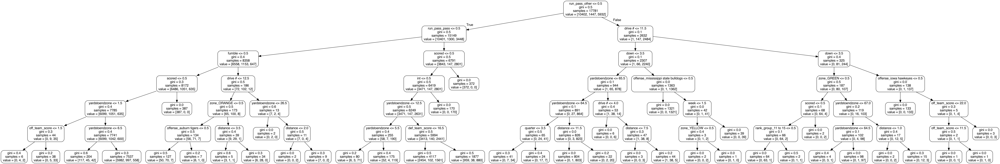

In [111]:
# tree with max depth of 6
clf_gl = DecisionTreeClassifier(max_depth=6)

clf_gl.fit(X_gl_train, y_gl_train)

y_pred_gl = clf_gl.predict(X_gl_test)

print("Accuracy:",metrics.accuracy_score(y_gl_test, y_pred_gl))
print("Precision:", metrics.precision_score(y_gl_test, y_pred_gl, average='weighted'))
print("Recall:", metrics.recall_score(y_gl_test, y_pred_gl, average='weighted'))

tree = clf_gl
# Export the image to a dot file
export_graphviz(tree, out_file = 'tree.dot', feature_names = X_gl_train.columns, rounded = True, precision = 1)
# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('tree.dot')
# Write graph to a png file
graph.write_png('tree.png')
#show image
Image(graph.create_png())

In [83]:
# get corresponding class names from encoded target variable
class_names = list(le.inverse_transform([0, 1, 2]))

Confusion matrix, without normalization
[[5115   23   32]
 [ 582  126   21]
 [1472   23 1365]]
Normalized confusion matrix
[[0.9893617  0.00444874 0.00618956]
 [0.79835391 0.17283951 0.02880658]
 [0.51468531 0.00804196 0.47727273]]


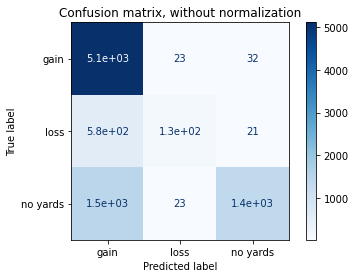

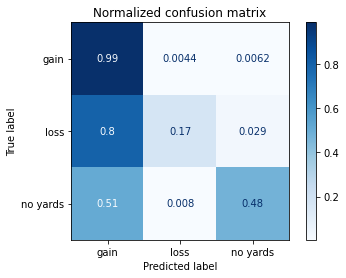

In [84]:
#confusion matrix

from sklearn.metrics import plot_confusion_matrix

# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(clf_gl, X_gl_test, y_gl_test,
                                 cmap=plt.cm.Blues,
                                 display_labels=class_names,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show();

<p style= "font-family: Times ; font-size: 18px">
    This classifier does a poor job predicting plays where yards are lost, classifying them as a gain 80% of the time

30


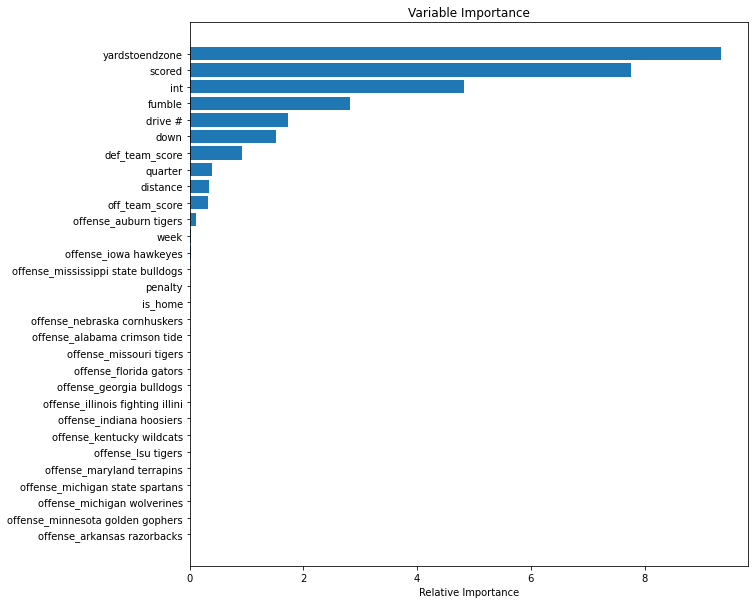

In [85]:
feature_importance = clf_gl.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())[:30]
sorted_idx = np.argsort(feature_importance)[:30]

pos = np.arange(sorted_idx.shape[0]) + .5
print(pos.size)
sorted_idx.size
plt.figure(figsize=(10,10))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_gl_train.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

<p style= "font-family: Times ; font-size: 18px">
    Features have lower relative importance with gain_loss prediction than scored prediction

# Random Forest

In [86]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import confusion_matrix

rf_gl = RandomForestClassifier(n_estimators=300, random_state = 1)
model_gl = rf_gl.fit(X_gl_train, y_gl_train)
y_pred_gl = model_gl.predict(X_gl_test)


ac = accuracy_score(y_gl_test, y_pred_gl)

#weighted average
f1_weighted = f1_score(y_gl_test, y_pred_gl, average='weighted')
f1_macro = f1_score(y_gl_test, y_pred_gl, average='macro')

print('Random Forest: Accuracy=%.3f' % (ac))

print('Random Forest: f1-score weighted =%.3f' % (f1_weighted))

print('Random Forest: f1-score macro =%.3f' % (f1_macro))

cm = confusion_matrix(y_gl_test, y_pred_gl)
print(cm)

Random Forest: Accuracy=0.743
Random Forest: f1-score weighted =0.722
Random Forest: f1-score macro =0.572
[[4554   57  559]
 [ 573   96   60]
 [ 977   25 1858]]


In [87]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score

# Instantiate model with 1000 decision trees
rf_gl = RandomForestClassifier(n_estimators = 1000, random_state = 1)


# Train the model on training data
rf_gl.fit(X_gl_train, y_gl_train)

y_pred_gl = rf_gl.predict(X_gl_test)

print("Accuracy:", accuracy_score(y_gl_test, y_pred_gl))
print("f1-score weighted:", f1_score(y_gl_test, y_pred_gl, average='weighted'))
print("f1-score macro:", f1_score(y_gl_test, y_pred_gl, average='macro'))


Accuracy: 0.7456330631350611
f1-score weighted: 0.7242158650323792
f1-score macro: 0.5752145036661838


In [112]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import confusion_matrix

rf_gl = RandomForestClassifier(n_estimators=300, random_state = 1, max_depth=14)
model_gl = rf_gl.fit(X_gl_train, y_gl_train)
y_pred_gl = model_gl.predict(X_gl_test)


ac = accuracy_score(y_gl_test, y_pred_gl)

#weighted average
f1_weighted = f1_score(y_gl_test, y_pred_gl, average='weighted')
f1_macro = f1_score(y_gl_test, y_pred_gl, average='macro')

print('Random Forest: Accuracy=%.3f' % (ac))

print('Random Forest: f1-score weighted =%.3f' % (f1_weighted))

print('Random Forest: f1-score macro =%.3f' % (f1_macro))

print("Precision:", metrics.precision_score(y_gl_test, y_pred_gl, average='weighted'))
print("Recall:", metrics.recall_score(y_gl_test, y_pred_gl, average='weighted'))


cm = confusion_matrix(y_gl_test, y_pred_gl)
print(cm)

Random Forest: Accuracy=0.754
Random Forest: f1-score weighted =0.722
Random Forest: f1-score macro =0.559
Precision: 0.7762257765820438
Recall: 0.7538531795867108
[[4943    9  218]
 [ 601   74   54]
 [1268    6 1586]]


Confusion matrix, without normalization
[[4943    9  218]
 [ 601   74   54]
 [1268    6 1586]]
Normalized confusion matrix
[[0.95609284 0.00174081 0.04216634]
 [0.82441701 0.10150892 0.07407407]
 [0.44335664 0.0020979  0.55454545]]


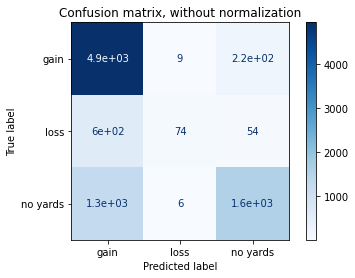

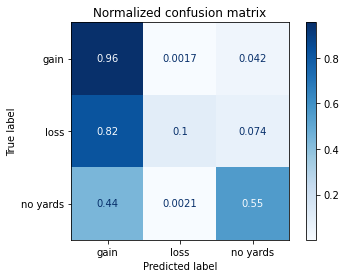

In [89]:
# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(rf_gl, X_gl_test, y_gl_test,
                                 cmap=plt.cm.Blues,
                                 display_labels=class_names,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show();

<p style= "font-family: Times ; font-size: 18px">
Neither the decision tree nor the forest classifier does a good job at prediciting plays with neither a gain or loss of yards. They both predict a lot of no yards and negative yardage plays as plays with a gain, likely because there are so many more plays with yards gained

# logistic regression

In [90]:
#basic model
lr_gl = LogisticRegression()

# Fit the model 
lr_gl.fit(X_gl_train, y_gl_train)

#predict
y_lr_gl_pred = lr_gl.predict(X_gl_test)

print(accuracy_score(y_gl_test, y_lr_gl_pred))
print(np.sqrt(metrics.mean_squared_error(y_gl_test, y_lr_gl_pred)))
print(metrics.r2_score(y_gl_test, y_lr_gl_pred))

0.7336453933097385
0.9031790462262647
0.03716406812631723


/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [91]:
#implement randomized search
# increase max_iter 

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import expon

params = {'C': expon(scale=100), 'class_weight':['balanced', None], 'penalty':['l1', 'l2', 'elasticnet', 'none']}

lr_gl10 = LogisticRegression(max_iter=10000)

search10 = RandomizedSearchCV(lr_gl10, params, random_state=1)
search_res10 = search10.fit(X_gl_train, y_gl_train)
search_res10.best_params_

/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.

  FitFailedWarning)

{'C': 54.00910464444293, 'class_weight': None, 'penalty': 'l2'}

In [92]:
lr_gl2 = LogisticRegression(C=54, max_iter=10000)

# Fit the model 
lr_gl2.fit(X_gl_train, y_gl_train)

#predict
y_lr_gl_pred2 = lr_gl2.predict(X_gl_test)

print(accuracy_score(y_gl_test, y_lr_gl_pred2))
print(np.sqrt(metrics.mean_squared_error(y_gl_test, y_lr_gl_pred2)))
print(metrics.r2_score(y_gl_test, y_lr_gl_pred2))


0.7492864482246832
0.8723793793309791
0.10171248119384613


In [93]:
#change solver to 'saga'

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import expon

params = {'C': expon(scale=100), 'class_weight':['balanced', None], 'penalty':['l1', 'l2', 'elasticnet', 'none']}

lr_gl = LogisticRegression(max_iter=10000, solver='saga')

search = RandomizedSearchCV(lr_gl, params, random_state=1)
search_res = search.fit(X_gl_train, y_gl_train)
search_res.best_params_

/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)


{'C': 20.61146340820805, 'class_weight': None, 'penalty': 'l1'}

In [134]:
lr_glso = LogisticRegression(C=20.6, solver='saga',penalty='l1')

# Fit the model 
lr_glso.fit(X_gl_train, y_gl_train)

#predict
y_lr_gl_predso = lr_glso.predict(X_gl_test)

print(accuracy_score(y_gl_test, y_lr_gl_predso))
print(np.sqrt(metrics.mean_squared_error(y_gl_test, y_lr_gl_predso)))
print(metrics.r2_score(y_gl_test, y_lr_gl_predso))
print(metrics.precision_score(y_gl_test, y_lr_gl_predso, average='weighted'))
print(metrics.recall_score(y_gl_test, y_lr_gl_predso, average='weighted'))

0.7446055485786048
0.8785737125971388
0.08891060386312533
0.7314056877063052
0.7446055485786048


/Users/regan/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


<p style= "font-family: Times ; font-size: 18px">
The regression with C=54 gives the best r2 score and accuracy score. 

<h2 style="background-color:#FAFAD2;"><center><br>Modeling yards</center>
</h2>

# linear regression

In [106]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

reg = LinearRegression()
reg.fit(X_yards_train, y_yards_train)
reg_pred = reg.predict(X_yards_test)

# The coefficients
print('Coefficients: \n', reg.coef_)
# The mean squared error
print('Mean squared error: %.2f'
      % mean_squared_error(y_yards_test, reg_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'
      % r2_score(y_yards_test, reg_pred))

Coefficients: 
 [-1.48291164e-01  2.55308968e-01 -3.57679506e-01  2.07080687e-02
  3.03336133e-02  2.36437519e-01 -5.21934567e+00 -1.99766718e+00
 -3.98841687e-03  1.18701755e+01  2.22897190e-01  5.53752582e-03
  2.69960483e-02  4.24370363e-01 -5.04331679e-01 -2.26392781e-01
 -1.39358638e-03 -1.29941138e-01 -6.33605404e-01  3.93557873e-01
 -3.50113352e-01  4.55717658e-01  6.02569381e-01 -3.97525286e-02
 -1.85353485e-01  6.62825704e-02  5.28255431e-01  2.02897488e-01
 -1.30713572e-01  6.21600686e-01 -3.44653751e-01  3.36384425e-01
  4.57282667e-01  6.53739170e-02 -5.29268374e-01 -3.07976637e-01
 -5.00489469e-01 -2.60339560e-02  1.93692492e-01 -7.66654235e-01
  3.28688995e-01  1.47386634e+00 -5.74774765e+00  1.96479919e+00
  1.69006684e+00 -1.99687827e+00  1.17857726e-01  2.49803582e+00
 -5.05796337e-02  5.05796337e-02 -3.94894177e+00  3.03532677e+00
  9.13614997e-01  3.00245425e-01 -1.54452053e-01 -1.39138638e-02
 -1.41059045e-01  2.22393454e-01 -2.13213917e-01  2.64178497e-01
 -2.49873

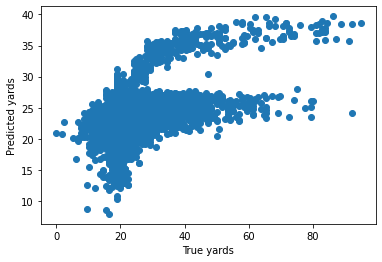

In [107]:
plt.scatter(y_yards_test, reg_pred)
plt.xlabel('True yards')
plt.ylabel('Predicted yards');

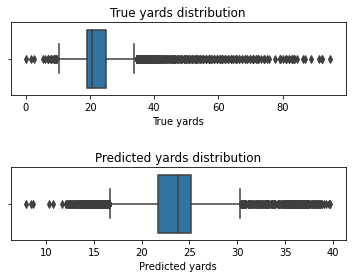

In [108]:
f, ax = plt.subplots(2)
sns.boxplot(y_yards_test, ax=ax[0])
sns.boxplot(reg_pred, ax=ax[1])

plt.subplots_adjust(hspace=1)
ax[0].set_xlabel('True yards')
ax[1].set_xlabel('Predicted yards')
ax[0].set_title('True yards distribution')
ax[1].set_title("Predicted yards distribution");

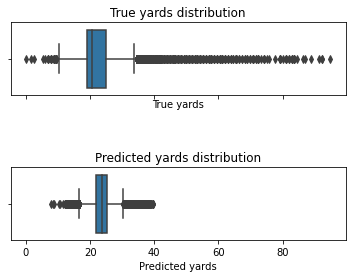

In [109]:
f, ax = plt.subplots(2, 1, sharex=True)
sns.boxplot(y_yards_test, ax=ax[0])
sns.boxplot(reg_pred, ax=ax[1])

plt.subplots_adjust(hspace=1)
ax[0].set_xlabel('True yards')
ax[1].set_xlabel('Predicted yards')
ax[0].set_title('True yards distribution')
ax[1].set_title("Predicted yards distribution");


<p style= "font-family: Times ; font-size: 18px">
    This model underpredicts yards. It does not predict any yard gains over 40 (scaled), while the true yards go up to 100 (scaled). 

# random forest regressor

In [99]:
# random forest regressor

from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(random_state=42)

regressor.fit(X_yards_train, y_yards_train)

y_pred = regressor.predict(X_yards_test)

y_pred



array([23.12931034, 19.27586207, 22.3362069 , ..., 25.82758621,
       21.27586207, 24.76724138])

In [100]:
from sklearn.metrics import r2_score,mean_squared_error
mse = mean_squared_error(y_yards_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_yards_test, y_pred)

print("MSE:", mse)
print("RMSE:", rmse)
print('R2:', r2)

MSE: 41.891986338512496
RMSE: 6.4724018987167735
R2: 0.38100796297820283


<p style= "font-family: Times ; font-size: 18px">
    This model shows an improvement in MSE and R2 over the linear regression


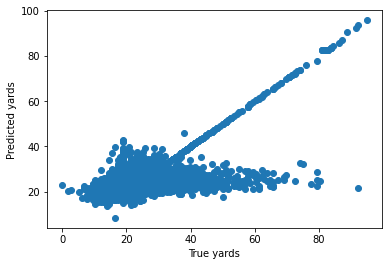

In [110]:
plt.scatter(y_yards_test, y_pred)
plt.xlabel('True yards')
plt.ylabel('Predicted yards');

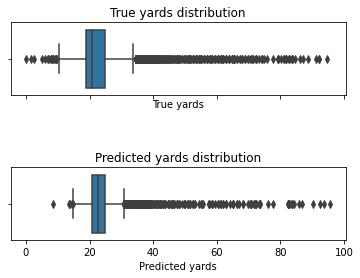

In [102]:
f, ax = plt.subplots(2,1,sharex=True)
sns.boxplot(y_yards_test, ax=ax[0])
sns.boxplot(y_pred, ax=ax[1])

plt.subplots_adjust(hspace=1)
ax[0].set_xlabel('True yards')
ax[1].set_xlabel('Predicted yards')
ax[0].set_title('True yards distribution')
ax[1].set_title("Predicted yards distribution");

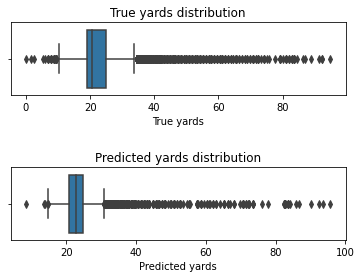

In [103]:
f, ax = plt.subplots(2)
sns.boxplot(y_yards_test, ax=ax[0])
sns.boxplot(y_pred, ax=ax[1])

plt.subplots_adjust(hspace=1)
ax[0].set_xlabel('True yards')
ax[1].set_xlabel('Predicted yards')
ax[0].set_title('True yards distribution')
ax[1].set_title("Predicted yards distribution");

<p style= "font-family: Times ; font-size: 18px">
    The random forest regressor has a lower RMSE and a higher r2 than the linear regression model. Furthermore, it does a visibily better job at predicting high yardage gains.

30


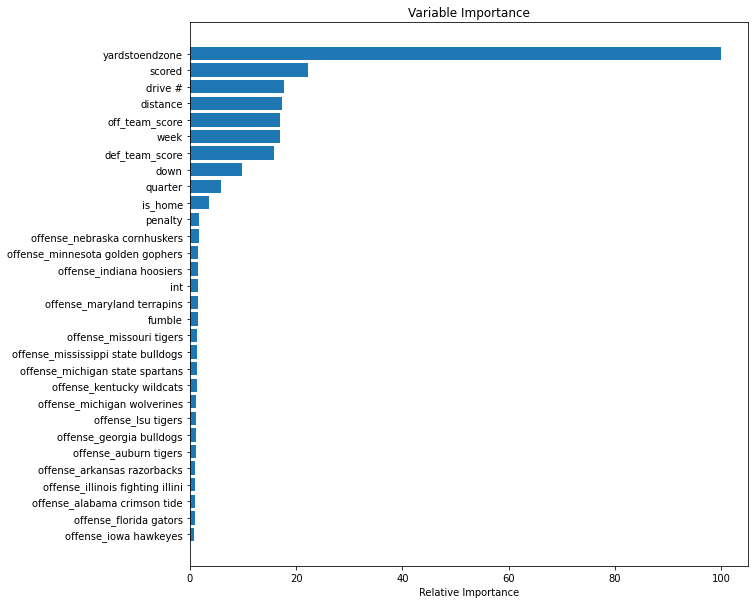

In [113]:
feature_importance_r = regressor.feature_importances_
# make importances relative to max importance
feature_importance_r = 100.0 * (feature_importance_r / feature_importance_r.max())[:30]
sorted_idx_r = np.argsort(feature_importance_r)[:30]

pos_r = np.arange(sorted_idx_r.shape[0]) + .5
print(pos_r.size)
sorted_idx_r.size
plt.figure(figsize=(10,10))
plt.barh(pos_r, feature_importance_r[sorted_idx_r], align='center')
plt.yticks(pos_r, X_yards_train.columns[sorted_idx_r])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()